In [1]:
import pickle
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from distance_result import DistanceResult
from utils import get_pwdf_per_condition, get_melted_df_per_perturbation
from utils import get_flat_df, normalize_per_metric, get_distance_per_perturbation, add_rank_col
from utils import get_ranked_df_per_perturbation, calc_rank_percentile  # sensitivity plots
from utils import plt_legend

sc.set_figure_params(dpi=100, frameon=False, facecolor=None)

Global seed set to 0
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
/usr/local/lib/python3.8/dist-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.


ryp2 is not installed. Install with pip install rpy2 to run tools with R support.

To use sccoda or tasccoda please install ete3 with pip install ete3

In [2]:
%load_ext autoreload
%autoreload 2

In [28]:
%%time
with open('metric_runs_simulated2.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['100-pca-n_cells', '100-lognorm-n_cells', '100-counts-n_cells', '200-pca-n_cells', '200-lognorm-n_cells', '200-counts-n_cells', '300-pca-n_cells', '300-lognorm-n_cells', '300-counts-n_cells', '400-pca-n_cells', '400-lognorm-n_cells', '400-counts-n_cells', '500-pca-n_cells', '500-lognorm-n_cells', '500-counts-n_cells', '600-pca-n_cells', '600-lognorm-n_cells', '600-counts-n_cells', '10-lognorm-n_genes', '10-counts-n_genes', '10-pca-n_genes', '50-lognorm-n_genes', '50-counts-n_genes', '50-pca-n_genes', '100-lognorm-n_genes', '100-counts-n_genes', '100-pca-n_genes', '500-lognorm-n_genes', '500-counts-n_genes', '500-pca-n_genes', '1000-lognorm-n_genes', '1000-counts-n_genes', '1000-pca-n_genes', '2000-lognorm-n_genes', '2000-counts-n_genes', '2000-pca-n_genes', '5000-lognorm-n_genes', '5000-counts-n_genes', '5000-pca-n_genes', '10-pca-n_DEGs', '10-lognorm-n_DEGs', '10-counts-n_DEGs', '20-pca-n_DEGs', '20-lognorm-n_DEGs', '20-counts-n_DEGs', '30-pca-n_DEGs', '30-lognorm-n_DEGs', 

In [29]:
metrics = list(results.values())[0].metrics
metrics

['mean_absolute_error',
 'cosine_distance',
 'ks_test',
 'euclidean',
 'edistance',
 'kendalltau_distance',
 'mse',
 'pearson_distance',
 'spearman_distance',
 'r2_distance']

In [18]:
controls = ['control0', 'control1', 'control2', 'control3', 'control4']

In [21]:
# %load plotting_util.py
def plot(tags, plot=True):
    label_tag = tags[0]
    
    pwdfs = {}
    for k, res in results.items():
        if all(t in k for t in tags):
            pwdfs.update(res.pwdfs)
    
    if len(pwdfs) < 2:
        raise ValueError(f'Conditions {tags} were not run.')

    individually_ranked = get_ranked_df_per_perturbation(pwdfs, metrics, controls, label_tag)
    ctrl_ranks = calc_rank_percentile(individually_ranked, controls)

    if plot:
        melted_df = get_flat_df(pwdfs, controls, label=label_tag)
        plt.figure(figsize=(10, 5))
        sns.lineplot(data=normalize_per_metric(melted_df), x=label_tag, y='avg_dist', hue='metric')
        plt.ylabel('relative avg dist');
        if 'n_genes' in label_tag:
            plt.xscale('log')
        plt_legend()
        plt.title(f'distance behavior w.r.t {label_tag} in {tags[1]} space')
        plt.show()

        ctrl_ranks[label_tag] = ctrl_ranks[label_tag].astype(float)
        plt.figure(figsize=(10, 5))
        sns.lineplot(data=ctrl_ranks, x=label_tag, y='rank', hue='metric')
        plt.ylabel('control rank percentile')
        plt.ylim(-.05, 1)
        if 'n_genes' in label_tag:
            plt.xscale('log')
        plt_legend()
        plt.title(f'sensitivity w.r.t. {label_tag} in {tags[1]} space')
        plt.show()
    
    return pwdfs, ctrl_ranks


## n_cells

Calculate and visualize change in distance due to sample size.

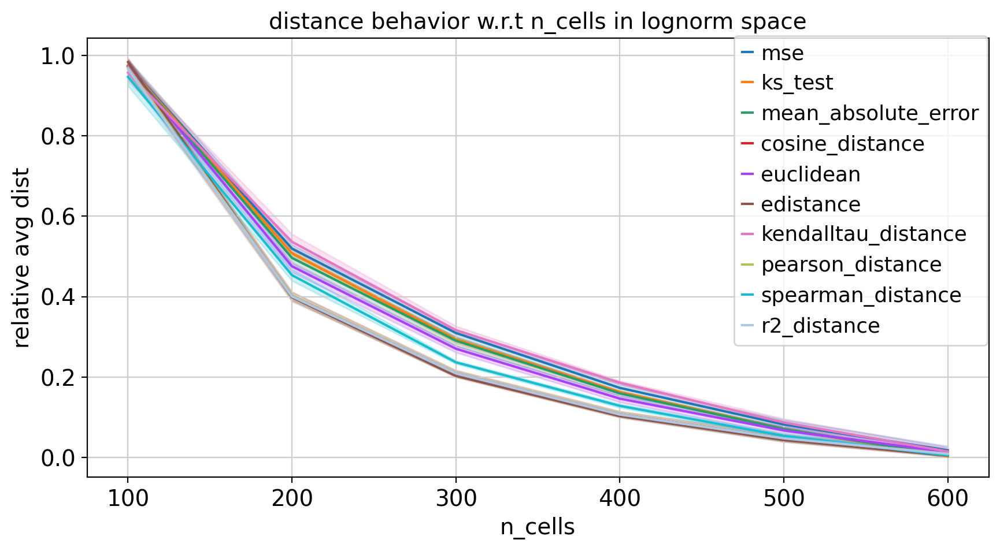

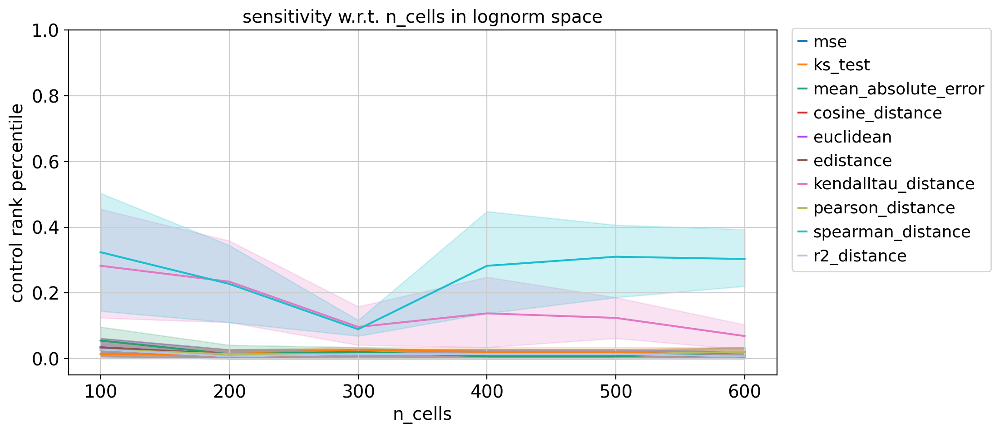

In [22]:
pwdfs, ctrl_ranks = plot(['n_cells', 'lognorm'])

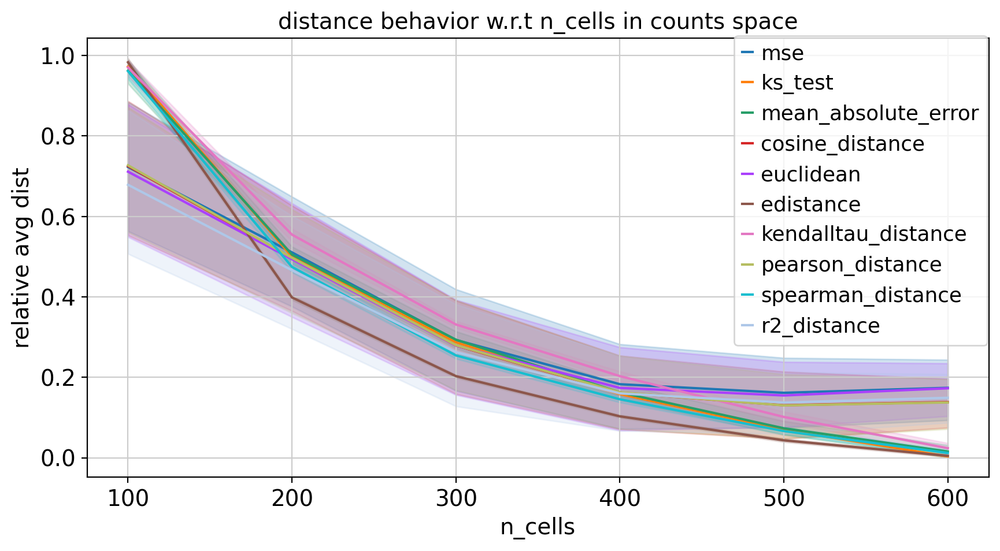

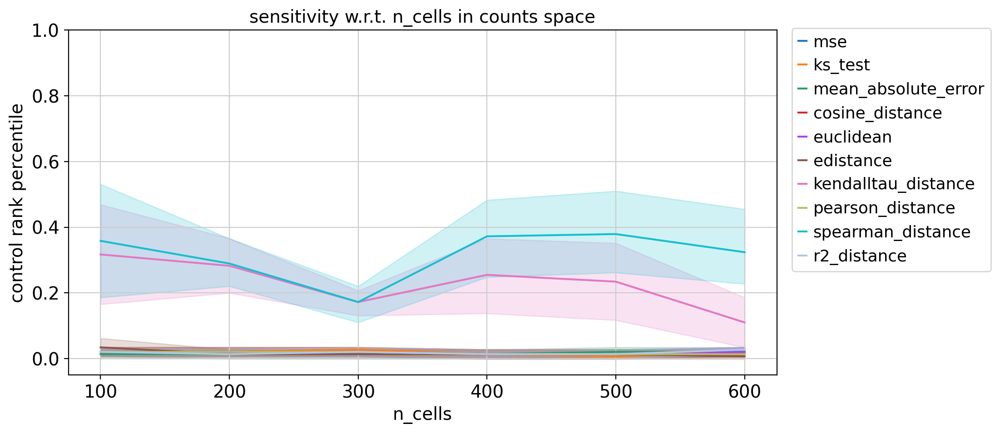

In [23]:
pwdfs, ctrl_ranks = plot(['n_cells', 'counts'])

Small changes in the control population lead to noisy shifts for these three metrics.

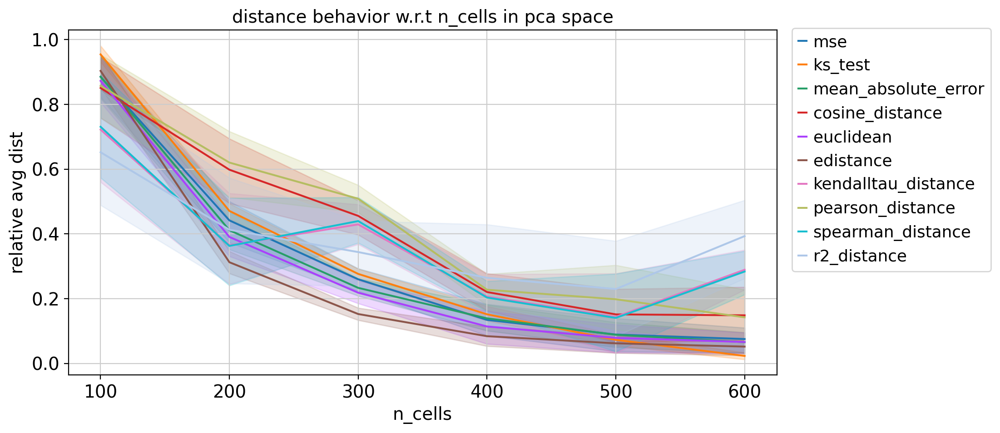

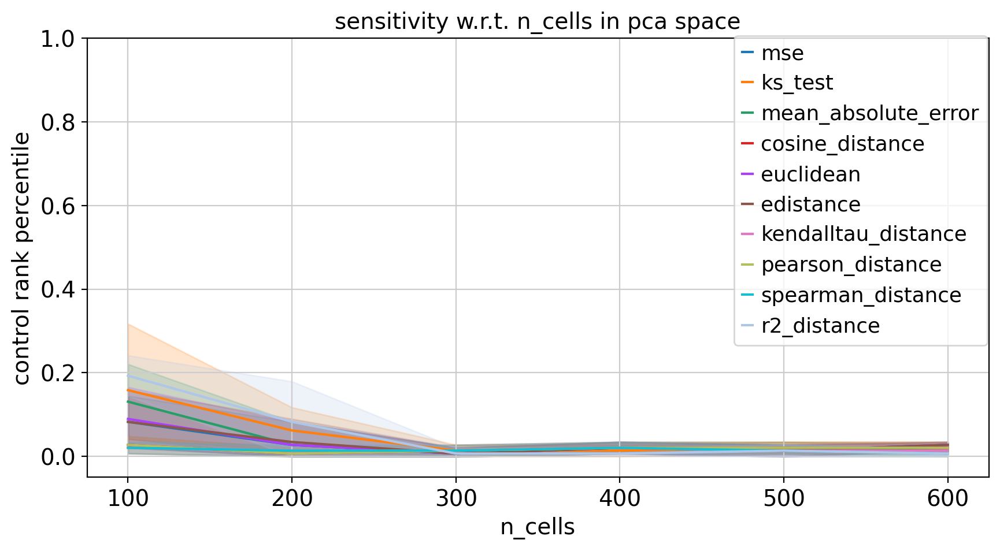

In [24]:
pwdfs, ctrl_ranks = plot(['n_cells', 'pca'])

## n highly variable genes

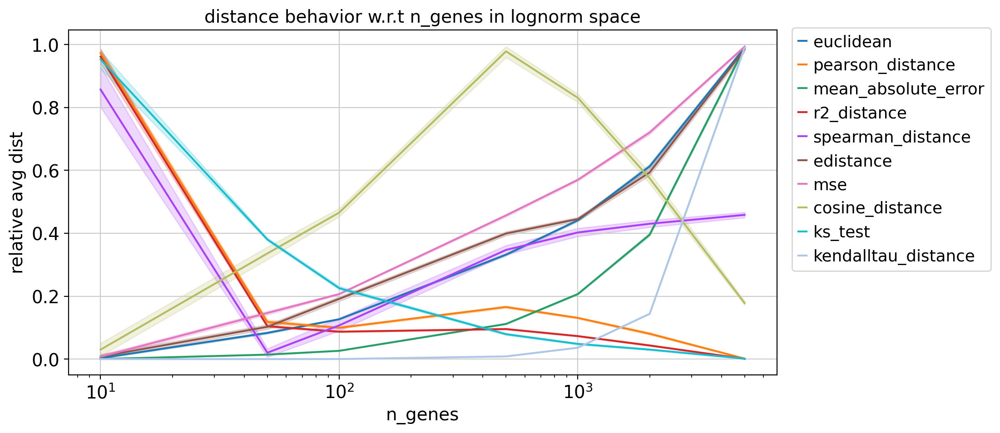

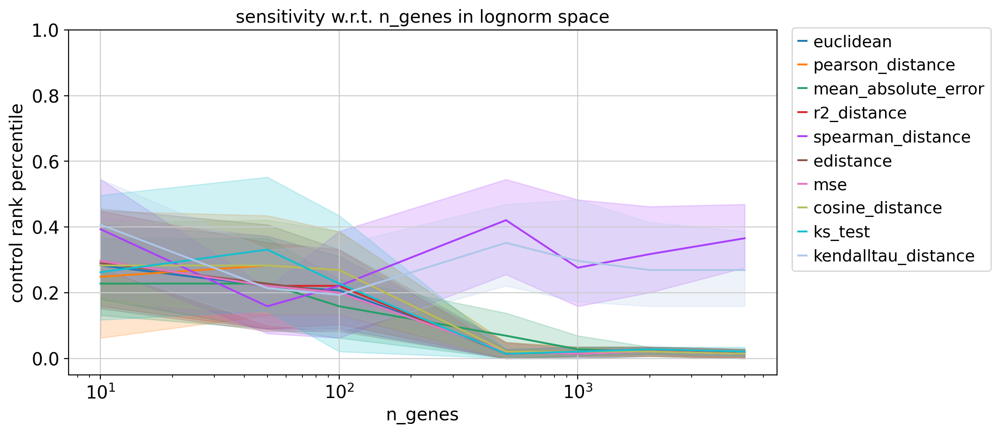

In [25]:
pwdfs, ctrl_ranks = plot(['n_genes', 'lognorm'])

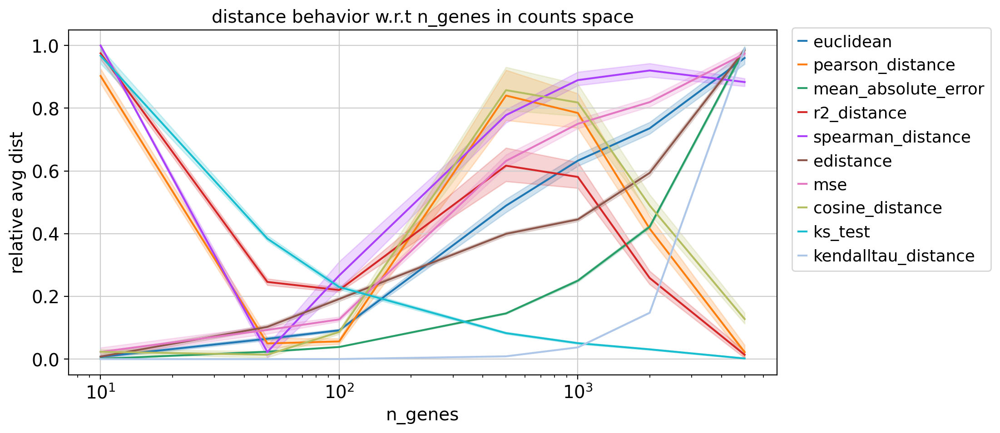

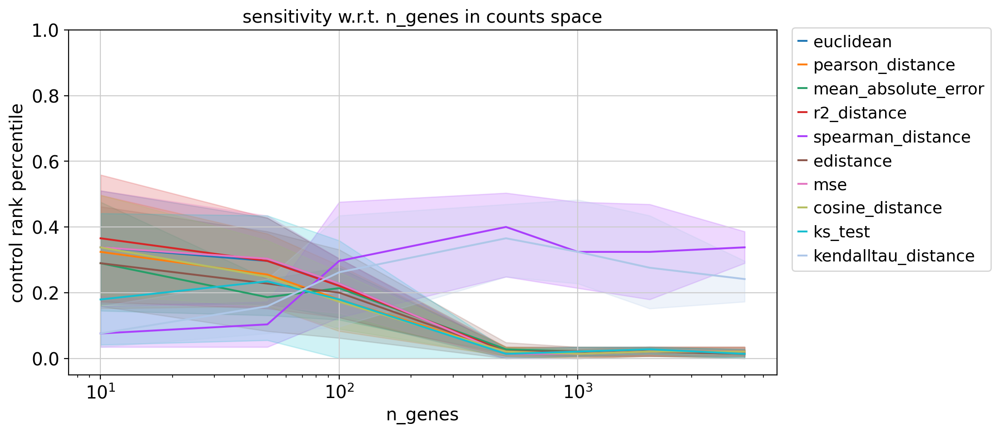

In [27]:
pwdfs, ctrl_ranks = plot(['n_genes', 'counts'])

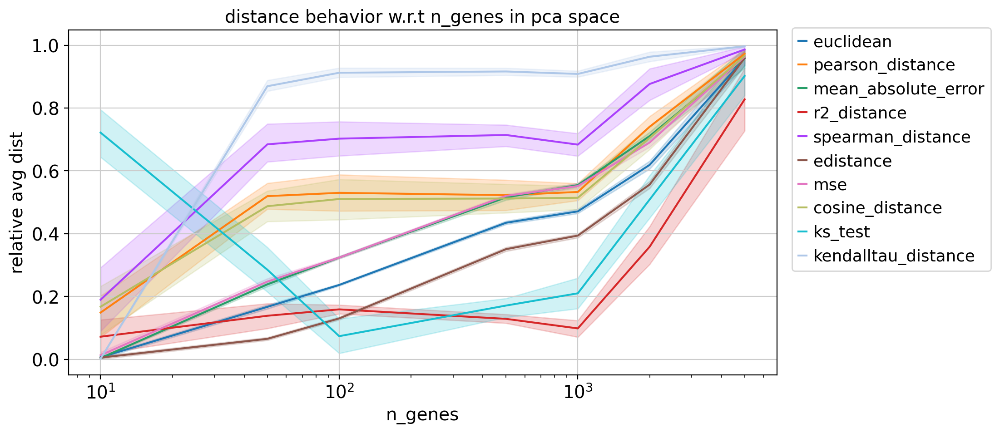

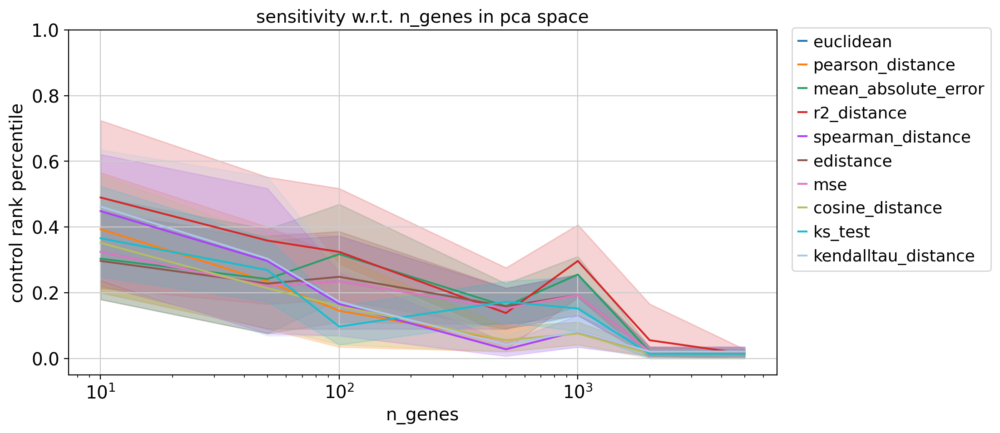

In [30]:
pwdfs, ctrl_ranks = plot(['n_genes', 'pca'])

## n differentially expressed genes

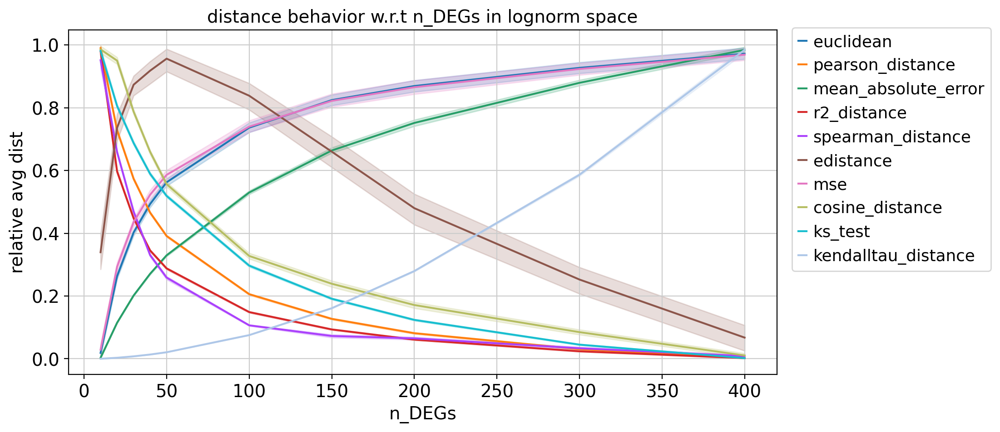

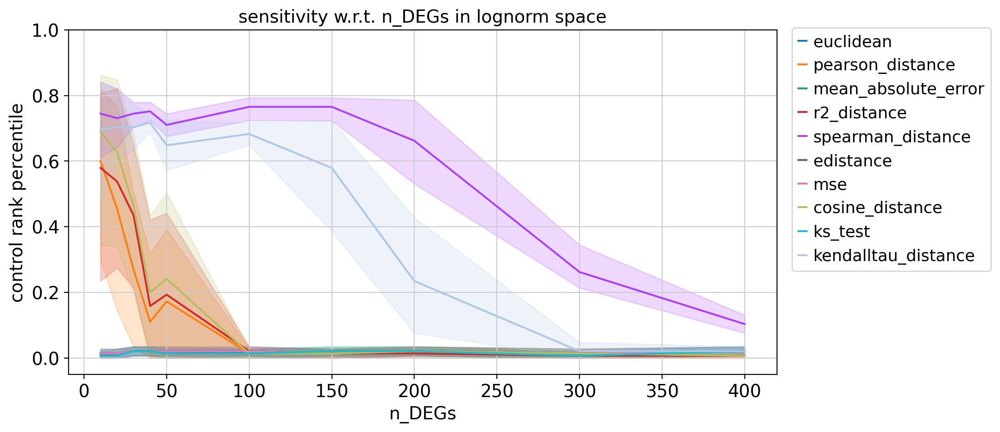

In [31]:
pwdfs, ctrl_ranks = plot(['n_DEGs', 'lognorm'])

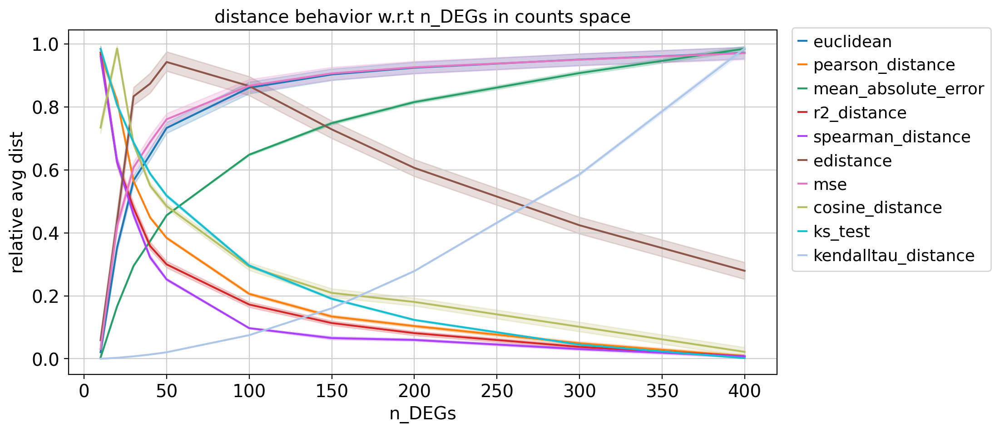

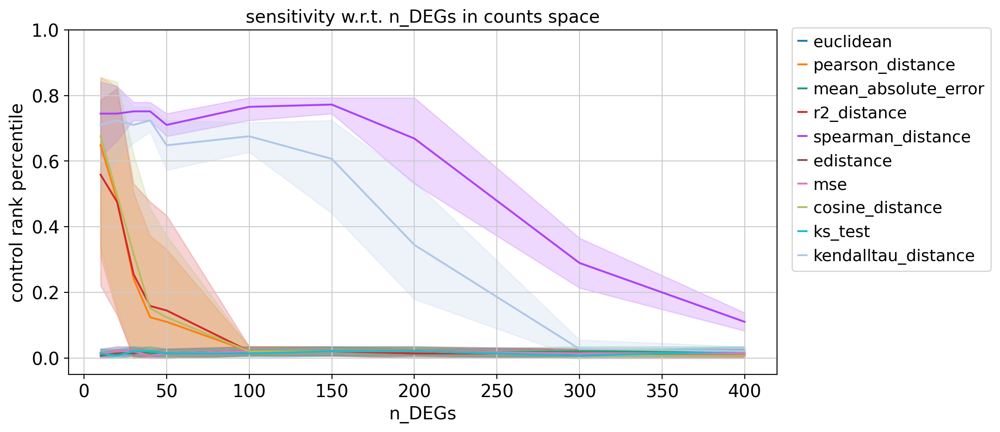

In [32]:
pwdfs, ctrl_ranks = plot(['n_DEGs', 'counts'])

## percent control contamination

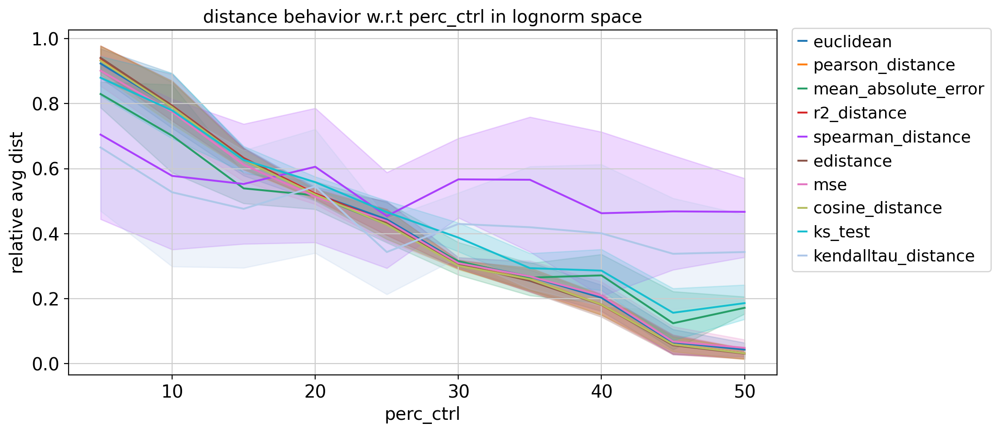

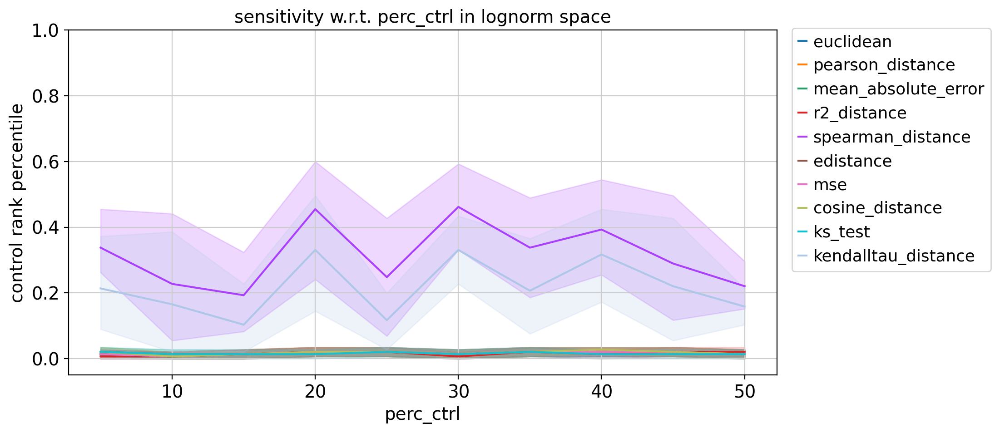

In [33]:
pwdfs, ctrl_ranks = plot(['perc_ctrl', 'lognorm'])

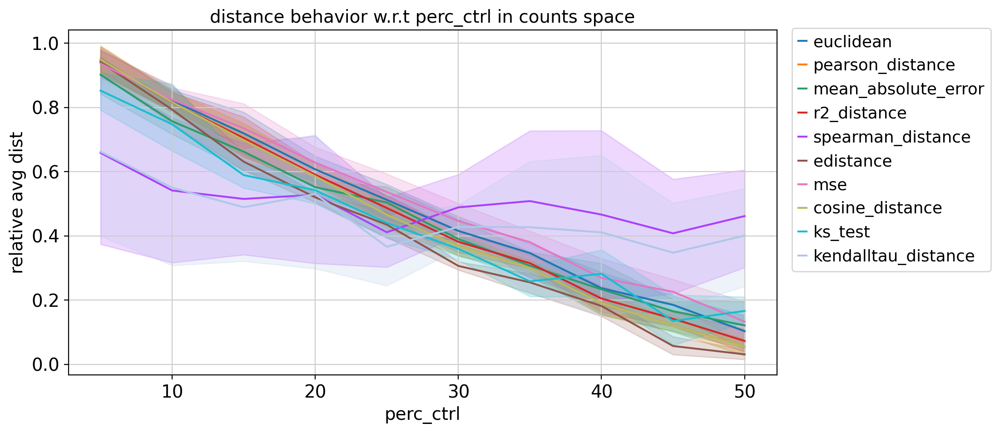

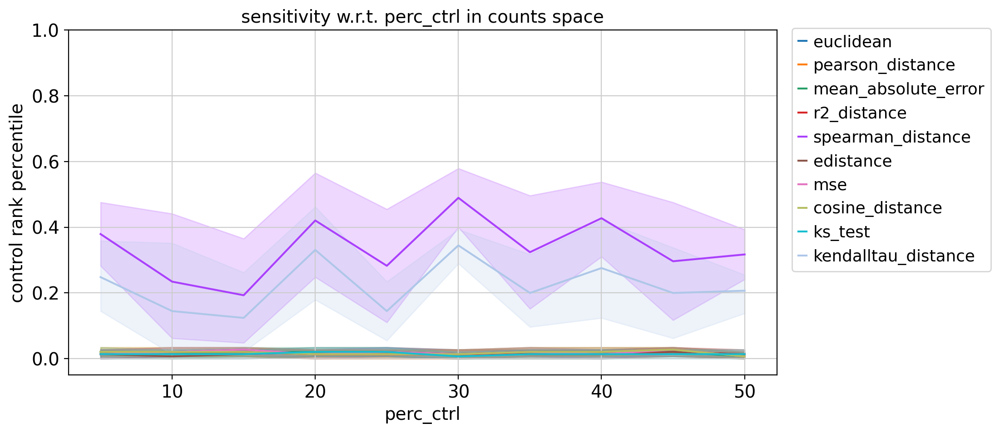

In [34]:
pwdfs, ctrl_ranks = plot(['perc_ctrl', 'counts'])

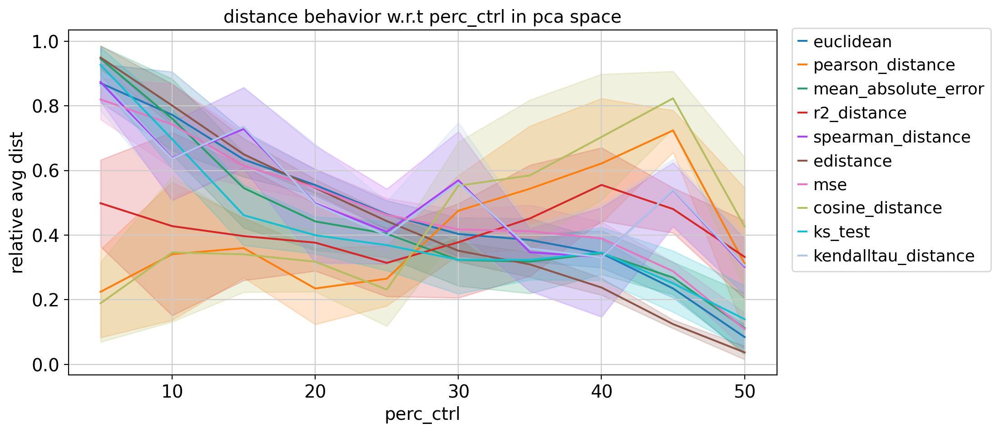

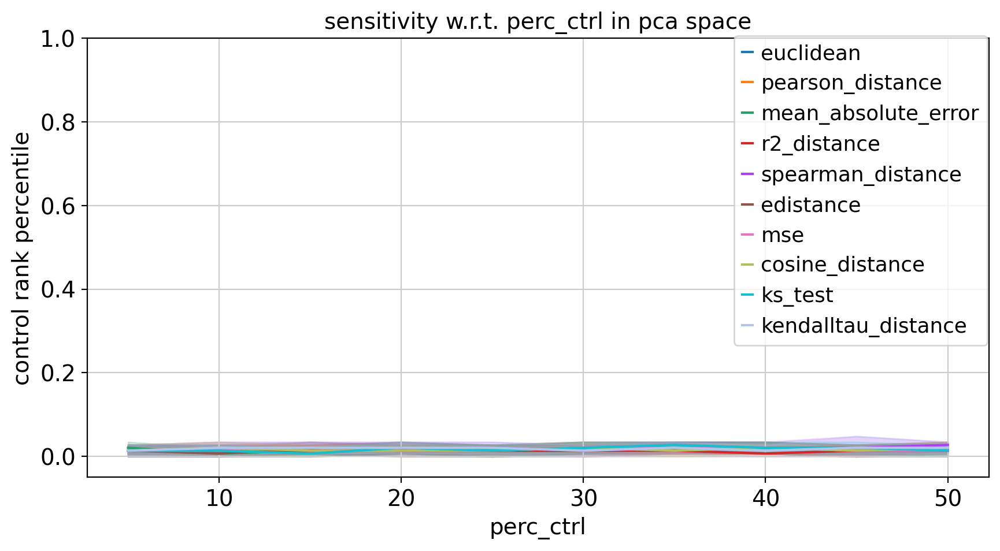

In [35]:
pwdfs, ctrl_ranks = plot(['perc_ctrl', 'pca'])

## library size

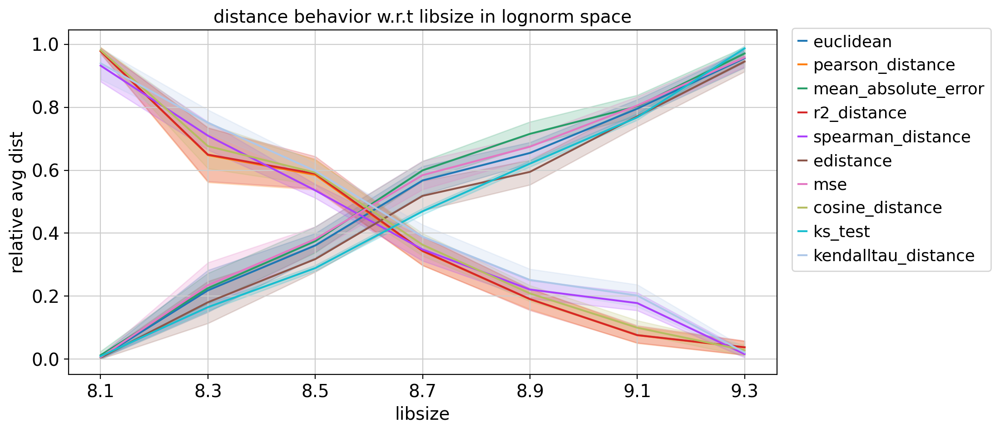

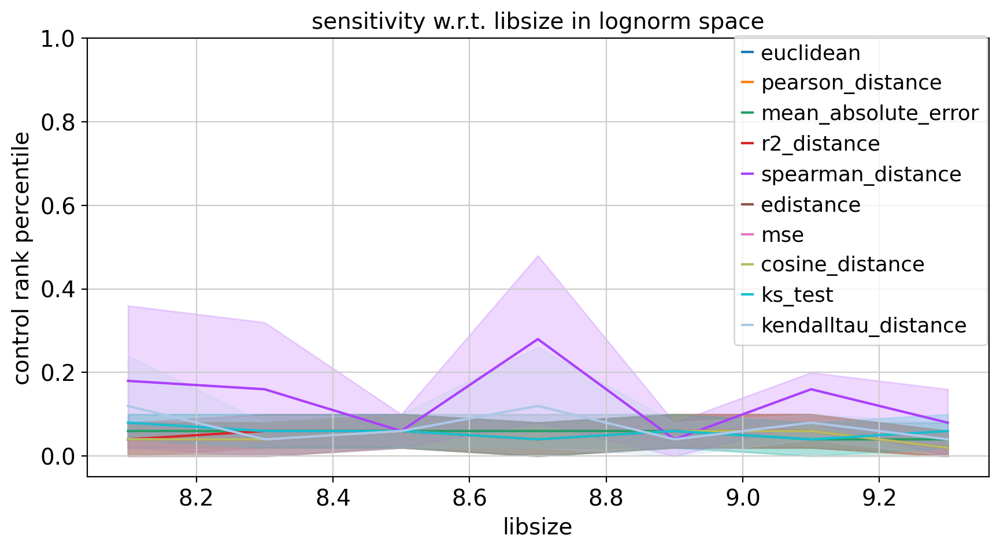

In [39]:
pwdfs, ctrl_ranks = plot(['libsize', 'lognorm'])

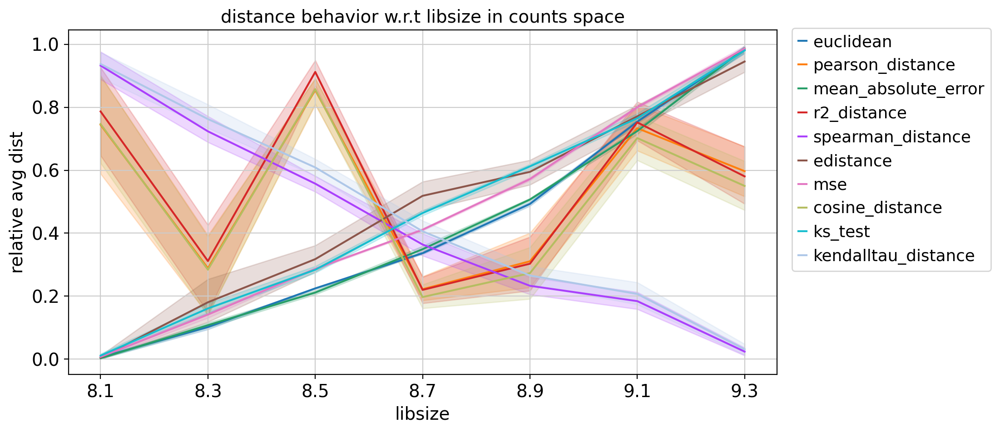

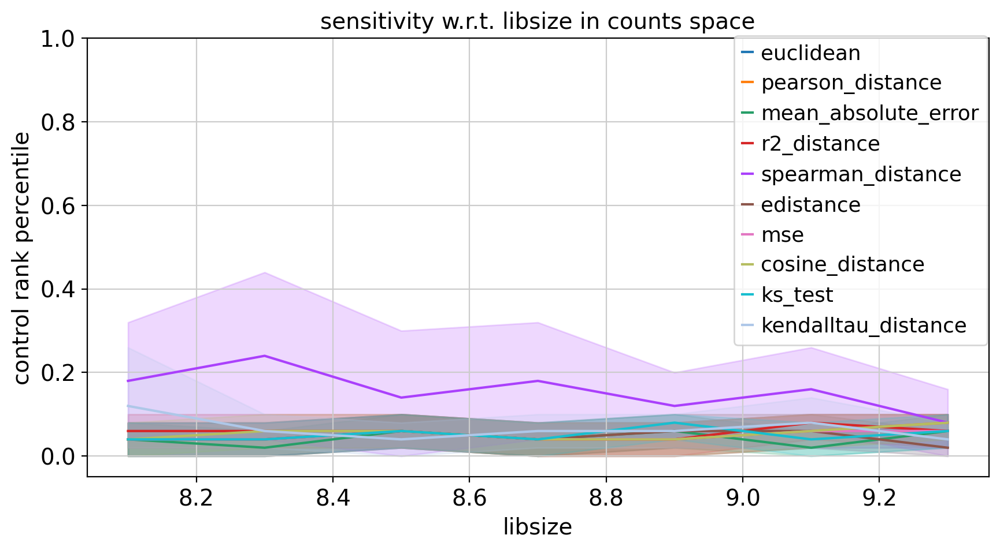

In [40]:
pwdfs, ctrl_ranks = plot(['libsize', 'counts'])

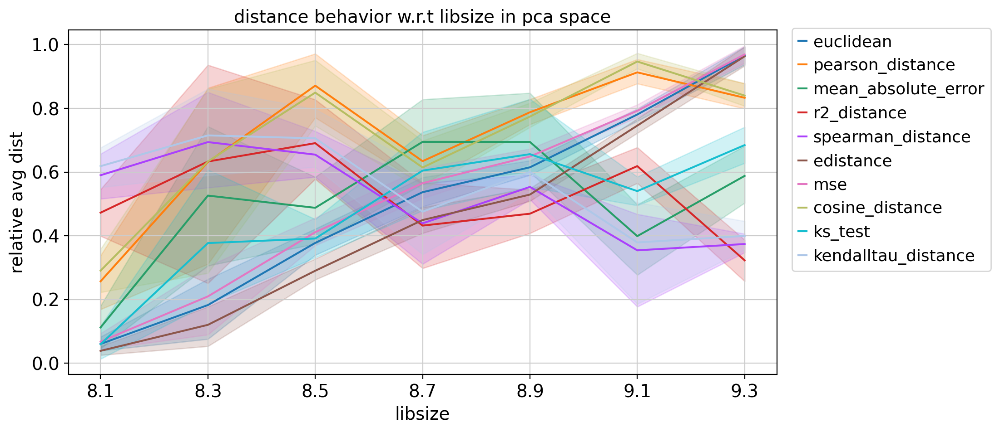

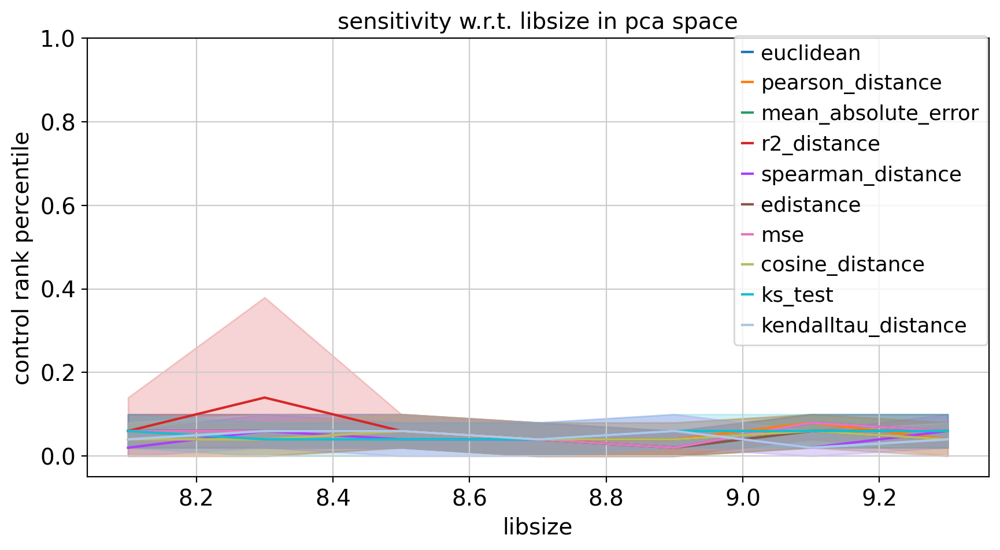

In [41]:
pwdfs, ctrl_ranks = plot(['libsize', 'pca'])

## summary table

### correlation with actual DE factors

Concatenate the _individual_ melted distance dataframes and label with metadata. Calculate and visualize change in distance due to sample size.

In [42]:
# get metadata
params = pd.read_csv('../splatter_sim_params.csv').reset_index()
params['perturbation'] = [f'Path{x}' for x in params['index'].values]
params.perturbation.replace({'Path1': 'control'}, inplace=True)

def annotate(df, params):
    # annotate
    for col in params.columns:
        df[col] = df['perturbation'].map(dict(zip(params.perturbation, params[col])))
    df = df.dropna()  # dropping fake controls

In [43]:
pwdfs, ctrl_ranks = plot(['n_genes', 'lognorm', '2000'], plot=False)

In [44]:
df = get_melted_df_per_perturbation(pwdfs, metrics, controls, 'n_genes', reference='pearson_distance-2000')
annotate(df, params)

Plot rankings together:

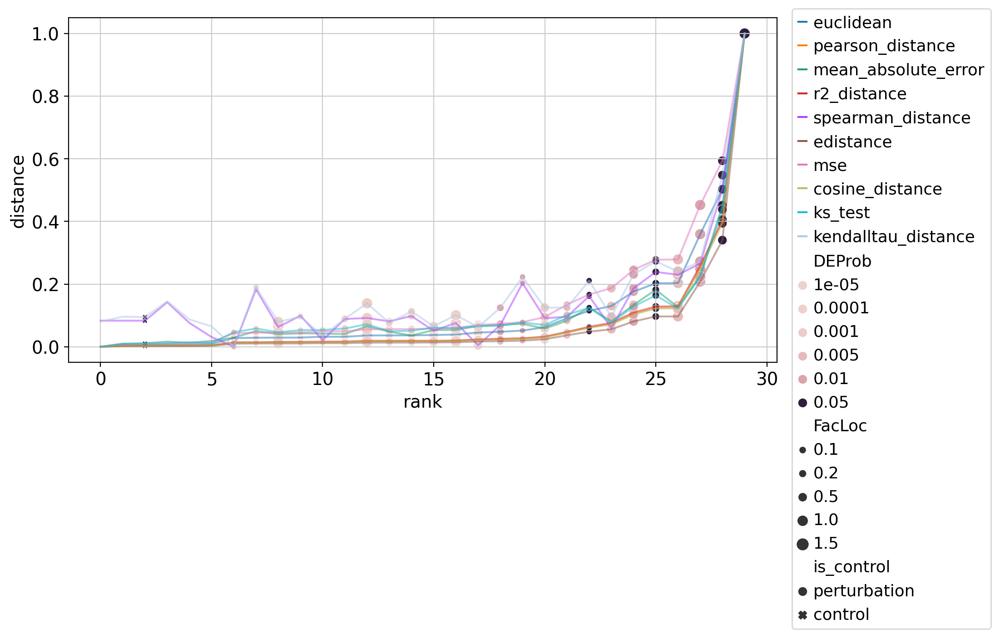

In [45]:
normed_df = normalize_per_metric(df, label='distance')
plt.figure(figsize=(10, 5))
sns.lineplot(data=normed_df, x='rank', y='distance', hue='metric', alpha=.5)
sns.scatterplot(data=normed_df, x='rank', y='distance', hue='DEProb', size='FacLoc', style='is_control')
plt.legend(bbox_to_anchor=(1.01, 1.05))

Calculate spearman correlation with DEProb per metric:

In [46]:
from scipy.stats import spearmanr

In [47]:
df = get_ranked_df_per_perturbation(pwdfs, metrics, controls, 'n_genes')
df = df[df.is_control == 'perturbation']
annotate(df, params)

In [48]:
sr = {}
for m in metrics:
    sub = df[df.metric == m]
    sr[m] = spearmanr(sub['distance'].values, sub.DEProb.values)[0]
corr_wreal = pd.DataFrame.from_dict(sr, orient='index').sort_values(0)
corr_wreal[0] = 1 - corr_wreal[0]  # flip so smaller is better
corr_wreal.columns = ['1-corr_DE']
corr_wreal

,1-corr_DE
spearman_distance,0.411402
kendalltau_distance,0.288044
cosine_distance,0.277470
pearson_distance,0.277470
euclidean,0.270421
edistance,0.270421
mse,0.270421
r2_distance,0.266896
mean_absolute_error,0.259847
ks_test,0.235175


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


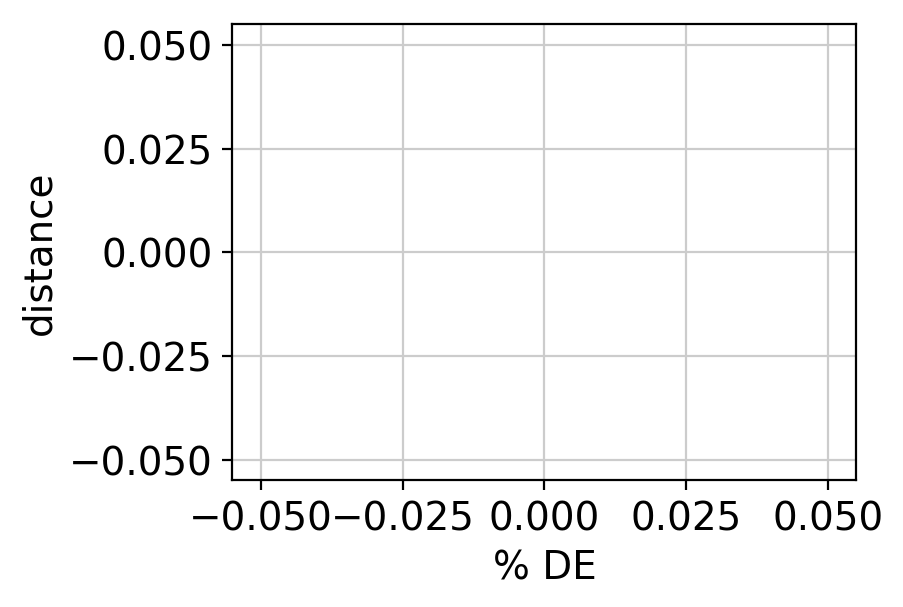

In [49]:
sub = normed_df[normed_df.metric == 'mmd']
sub = sub.rename(columns={'FacLoc':'LFC', 'DEProb': '% DE'})
plt.figure(figsize=(4, 3))
sns.regplot(data=sub, x='% DE', y='distance', scatter_kws={'s':1}, line_kws={'color':'grey', 'label':'corr=.78'})
sns.scatterplot(data=sub, x='% DE', y='distance', hue='LFC')
# plt.xscale('log')
# plt.yscale('log')
plt.legend(bbox_to_anchor=(1.01, 1.05), frameon=False)

### performance in the most realistic scenario

The most realistic scenario for evaluation is 5k highly variable genes, 300 cells per condition, no mislabeling and optimal library size.

In [50]:
pwdfs, ctrl_ranks = plot(['n_genes', 'lognorm'], plot=False)
best_case = ctrl_ranks[ctrl_ranks.n_genes == '2000']

avg_rank = best_case[['rank', 'metric']].groupby('metric').mean().sort_values('rank')
avg_rank.columns = ['rank_mean']

var_rank = best_case[['rank', 'metric']].groupby('metric').var().sort_values('rank')*100
var_rank.columns = ['rank_var*100']

### summary

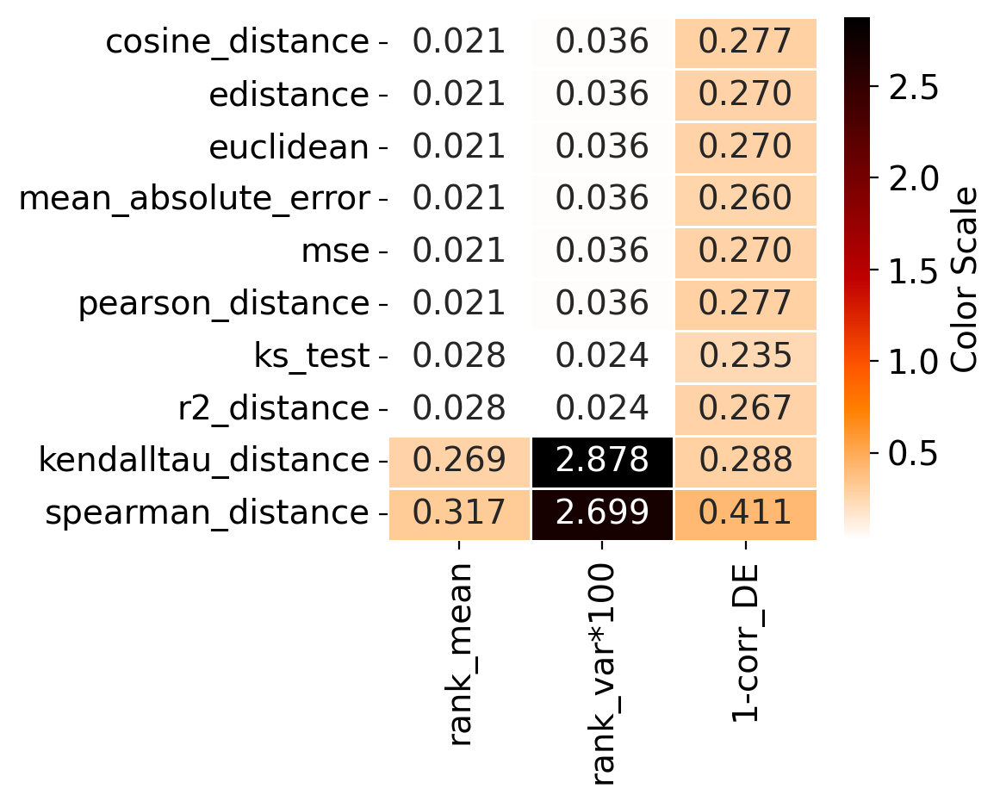

In [51]:
df = pd.concat([avg_rank, var_rank, corr_wreal], axis=1)
# df = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
sns.heatmap(df, annot=True, cmap='gist_heat_r', fmt=".3f", linewidths=.5, cbar_kws={'label': 'Color Scale'})
plt.grid(None)

In [52]:
df

,rank_mean,rank_var*100,1-corr_DE
cosine_distance,0.020690,0.035672,0.277470
edistance,0.020690,0.035672,0.270421
euclidean,0.020690,0.035672,0.270421
mean_absolute_error,0.020690,0.035672,0.259847
mse,0.020690,0.035672,0.270421
pearson_distance,0.020690,0.035672,0.277470
ks_test,0.027586,0.023781,0.235175
r2_distance,0.027586,0.023781,0.266896
kendalltau_distance,0.268966,2.877527,0.288044
spearman_distance,0.317241,2.699168,0.411402


## between metric correlation (old)

In [120]:
# get metadata
params = pd.read_csv('../splatter_sim_params.csv').reset_index()
params['perturbation'] = [f'Path{x}' for x in params['index'].values]
params.perturbation.replace({'Path1': 'control'}, inplace=True)

def annotate(df, params):
    # annotate
    for col in params.columns:
        df[col] = df.index.map(dict(zip(params.perturbation, params[col])))

In [121]:
pwdfs, ctrl_ranks = plot(['n_genes', 'lognorm'], plot=False)
df = pd.concat([pwdfs[f'{metric}-2000'].loc[['control0']] for metric in metrics]).T
df.columns = metrics
annotate(df, params)
df = df.dropna()

In [118]:
df.corr(method='spearman')

,t_test,kl_divergence,cosine_distance,euclidean,pearson_distance,wasserstein,edistance,mse,mmd,spearman_distance,mean_absolute_error,r2_distance,index,Prob,DEProb,DownProb,FacLoc,FacScale,Steps,Skew
t_test,1.000000,-0.022609,0.919130,0.912174,0.919130,0.655652,0.915851,0.912174,0.912174,0.866957,0.946087,0.923478,0.457391,NaN,0.690809,NaN,0.296110,0.296110,NaN,NaN
kl_divergence,-0.022609,1.000000,-0.103478,-0.103478,-0.103478,-0.066957,-0.105675,-0.103478,-0.103478,0.331304,-0.034783,-0.104348,0.184348,NaN,0.007049,NaN,0.188434,0.188434,NaN,NaN
cosine_distance,0.919130,-0.103478,1.000000,0.998261,1.000000,0.607826,0.998043,0.998261,0.998261,0.764348,0.879130,0.999130,0.507826,NaN,0.726055,NaN,0.339181,0.339181,NaN,NaN
euclidean,0.912174,-0.103478,0.998261,1.000000,0.998261,0.613043,0.999783,1.000000,1.000000,0.754783,0.865217,0.997391,0.498261,NaN,0.729579,NaN,0.328413,0.328413,NaN,NaN
pearson_distance,0.919130,-0.103478,1.000000,0.998261,1.000000,0.607826,0.998043,0.998261,0.998261,0.764348,0.879130,0.999130,0.507826,NaN,0.726055,NaN,0.339181,0.339181,NaN,NaN
wasserstein,0.655652,-0.066957,0.607826,0.613043,0.607826,1.000000,0.613612,0.613043,0.613043,0.504348,0.712174,0.619130,0.593913,NaN,0.546303,NaN,0.473776,0.473776,NaN,NaN
edistance,0.915851,-0.105675,0.998043,0.999783,0.998043,0.613612,1.000000,0.999783,0.999783,0.758426,0.867580,0.997173,0.490976,NaN,0.731500,NaN,0.320407,0.320407,NaN,NaN
mse,0.912174,-0.103478,0.998261,1.000000,0.998261,0.613043,0.999783,1.000000,1.000000,0.754783,0.865217,0.997391,0.498261,NaN,0.729579,NaN,0.328413,0.328413,NaN,NaN
mmd,0.912174,-0.103478,0.998261,1.000000,0.998261,0.613043,0.999783,1.000000,1.000000,0.754783,0.865217,0.997391,0.498261,NaN,0.729579,NaN,0.328413,0.328413,NaN,NaN
spearman_distance,0.866957,0.331304,0.764348,0.754783,0.764348,0.504348,0.758426,0.754783,0.754783,1.000000,0.808696,0.766957,0.487826,NaN,0.581549,NaN,0.355332,0.355332,NaN,NaN


Correlation between winners and runner ups:

In [131]:
def corr_plot(col1, col2, **kwargs):
    sns.scatterplot(data=df, x=col1, y=col2, **kwargs)
    corr = spearmanr(df[col1].values, df[col2].values)[0]
    plt.title(f'corr={corr:.3f}')
    plt.xscale('log')
    plt.yscale('log')
    plt_legend()

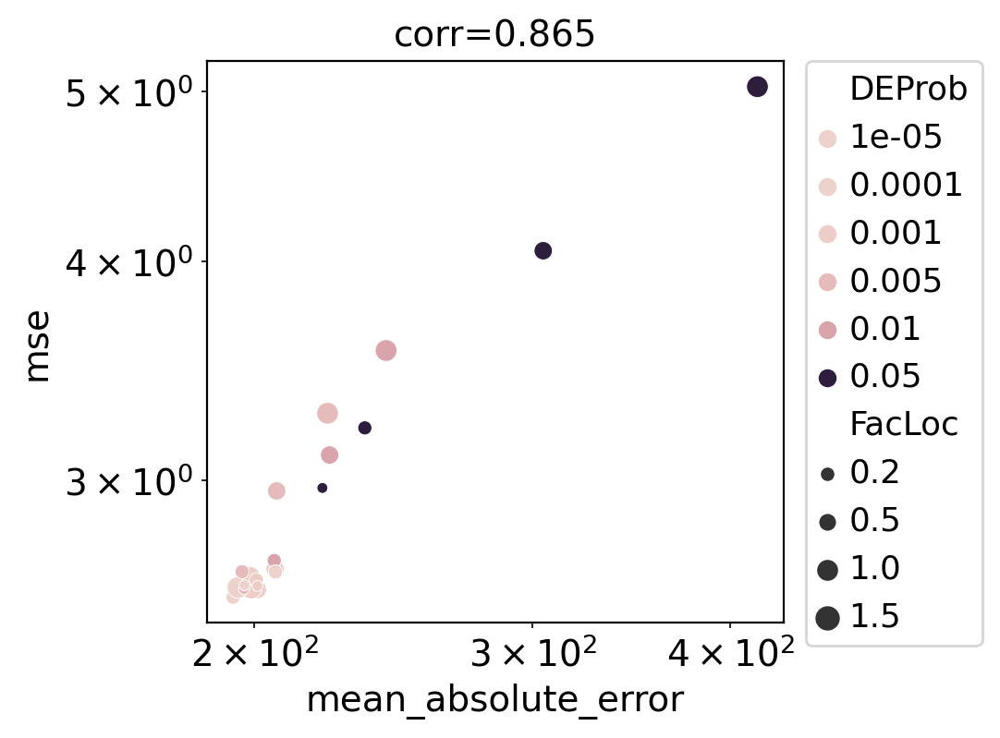

In [132]:
corr_plot('mean_absolute_error', 'mse', hue='DEProb', size='FacLoc')